In [1]:
import numpy as np
import pandas as pd
from tqdm import tqdm
from numba import jit
from scipy.stats import norm
import matplotlib.pyplot as plt
from datetime import datetime
import py_vollib_vectorized
from scipy.interpolate import interp1d
from scipy.interpolate import griddata
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams["figure.dpi"] = 480
plt.rcParams.update({'font.size': 13})

C:\Users\Yuning LI\AppData\Roaming\Python\Python311\site-packages\py_lets_be_rational\numba_helper.py:10: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  return jit(*jit_args, **jit_kwargs)(fun)


# Process the data

In [2]:
def DataProcess(datapath):

    NN = 4 # defiens how many options around atm you use in the refression for implied forwad and implied discount factor, min is 2
    DT_CONST = 24 * 3600 * 1000000000

    df = pd.read_csv(datapath, parse_dates=['date','exdate'], usecols=['date','exdate','cp_flag','strike_price','best_bid','best_offer','volume','forward_price','am_settlement'], engine="pyarrow")

    df["dte"] = (df["exdate"].astype('int64') - df["date"].astype('int64')) // DT_CONST
    df=df[(0 == df.am_settlement) & (df.dte > 0)]
    df.index = df['date']
    df.loc[:, 'strike_price'] = df.loc[:, 'strike_price'] / 1000
    df['mid_price'] = .5 * (df['best_bid'] + df['best_offer'])
    df = df[df['mid_price']>0]

    df.rename_axis(None, inplace=True)
    df.reset_index(inplace=True, drop=True)

    df['cp_flag'] = df['cp_flag'].map({'C': 'c', 'P': 'p'}).astype('category')

    df_ws = df.loc[:, ['date', 'exdate', 'strike_price', 'cp_flag', 'mid_price']].pivot(index=['date', 'exdate', 'strike_price'], columns='cp_flag')
    calls_p = df_ws.loc[:, ('mid_price', 'c')]
    puts_p = df_ws.loc[:, ('mid_price', 'p')]

    df_ws['m_ind'] = 1. - (calls_p - puts_p < 0)

    instr_group_p = df_ws.groupby(level=[0, 1])

    df_ws['m_ind'] = instr_group_p['m_ind'].transform('cumprod')


    df_ws['ind_full'] = instr_group_p['m_ind'].shift(NN).groupby(level=[0, 1]).bfill() - instr_group_p['m_ind'].shift(-NN).groupby(level=[0, 1]).ffill()
    df_ws['Ksum'] = df_ws.index.get_level_values('strike_price') * df_ws['ind_full']
    df_ws['Ksum2'] = df_ws.index.get_level_values('strike_price') * df_ws['Ksum']
    df_ws['Psum'] = (puts_p - calls_p) * df_ws['ind_full']
    df_ws['KPsum'] = df_ws.index.get_level_values('strike_price') * df_ws['Psum']

    df_ws['KsumI'] = instr_group_p['Ksum'].transform('sum')
    df_ws['Ksum2I'] = instr_group_p['Ksum2'].transform('sum')
    df_ws['PsumI'] = instr_group_p['Psum'].transform('sum')
    df_ws['KPsumI'] = instr_group_p['KPsum'].transform('sum')

    denom = (2 * NN) * df_ws['Ksum2I'] - df_ws['KsumI'] * df_ws['KsumI']
    df_ws['impl_df'] = ((2 * NN) * df_ws['KPsumI'] - df_ws['PsumI'] * df_ws['KsumI']) / denom
    df_ws['impl_fw'] = (df_ws['KsumI'] * df_ws['KPsumI'] - df_ws['Ksum2I'] * df_ws['PsumI']) / (
            denom * df_ws['impl_df'].values)

    df_ws['otm'] = (df_ws.index.get_level_values('strike_price')>=df_ws['impl_fw'])
    df_ws['dte'] = (df_ws.index.get_level_values("exdate").astype('int64') - df_ws.index.get_level_values("date").astype('int64')) / (24 * 3600 * 1e9 * 365)
    df_ws.loc[df_ws.dte==0, 'dte'] = 1e-7 # JUST TO PRODUCE A NUMBER, WILL BE OVWEWRITEN LATER ANYWAY
    df_ws['r'] = -np.log(df_ws['impl_df']) / df_ws['dte']
    df_ws['spot'] = df_ws['impl_fw']*df_ws['impl_df']

    indc = df_ws.otm
    df_ws.loc[indc, 'mid_vols'] = py_vollib_vectorized.vectorized_implied_volatility(df_ws.loc[indc][('mid_price', 'c')].values, df_ws.loc[indc].spot.values,
                                                                df_ws.loc[indc].index.get_level_values('strike_price').values, df_ws.loc[indc].dte.values,
                                                                df_ws.loc[indc].r.values,
                                                                                'c', q=0,
                                                                model='black_scholes_merton', return_as='numpy',
                                                                on_error='ignore')
    indc = ~df_ws.otm
    df_ws.loc[indc, 'mid_vols'] = py_vollib_vectorized.vectorized_implied_volatility(df_ws.loc[indc][('mid_price', 'p')].values, df_ws.loc[indc].spot.values,
                                                                df_ws.loc[indc].index.get_level_values('strike_price').values, df_ws.loc[indc].dte.values,
                                                                df_ws.loc[indc].r.values,
                                                                                'p', q=0,
                                                                model='black_scholes_merton', return_as='numpy',
                                                                on_error='ignore')


    df.loc[df.cp_flag=='c', 'impl_df'] = df_ws.loc[df_ws[('mid_price', 'c')].notna(), [('mid_price', 'c'), ('impl_df', ''), ]]['impl_df'].values
    df.loc[df.cp_flag=='p', 'impl_df'] = df_ws.loc[df_ws[('mid_price', 'p')].notna(), [('mid_price', 'p'), ('impl_df', ''), ]]['impl_df'].values

    df.loc[df.cp_flag=='c', 'impl_fw'] = df_ws.loc[df_ws[('mid_price', 'c')].notna(), [('mid_price', 'c'), ('impl_fw', ''), ]]['impl_fw'].values
    df.loc[df.cp_flag=='p', 'impl_fw'] = df_ws.loc[df_ws[('mid_price', 'p')].notna(), [('mid_price', 'p'), ('impl_fw', ''), ]]['impl_fw'].values

    df.loc[df.cp_flag=='c', 'mid_vols'] = df_ws.loc[df_ws[('mid_price', 'c')].notna(), [('mid_price', 'c'), ('mid_vols', ''), ]]['mid_vols'].values
    df.loc[df.cp_flag=='p', 'mid_vols'] = df_ws.loc[df_ws[('mid_price', 'p')].notna(), [('mid_price', 'p'), ('mid_vols', ''), ]]['mid_vols'].values


    df['dte1'] = (df["exdate"].astype('int64') - df["date"].astype('int64')) / (24 * 3600 * 1e9 * 365)

    df['r'] = -np.log(df['impl_df']) / df['dte']
    
    spot = df['impl_fw']*df['impl_df']
    df['spot'] = df['impl_fw']*df['impl_df']

    df['vega'] = py_vollib_vectorized.vectorized_vega(df.cp_flag, spot.values,
                                                                                df.strike_price.values, df.dte.values, df.r.values,
                                                                                df.mid_vols.values, q=0, model='black_scholes_merton',
                                                                                return_as='numpy')
    df['delta'] = py_vollib_vectorized.vectorized_delta(df.cp_flag, spot.values,
                                                                                df.strike_price.values, df.dte.values, df.r.values,
                                                                                df.mid_vols.values, q=0, model='black_scholes_merton',                                                                       return_as='numpy')
    df['moneyness'] = df['strike_price']/df['spot'] # calculate moneyness
    print('DONE')
    return df

In [3]:
df = DataProcess('optionMetricsSpx2022.csv')

DONE


## Find implied volatility surface and r surface for each day

In [11]:
unique_dates = df['date'].unique()
moneyness_grid = np.linspace(0.6, 1.4, 10)
dte_grid = np.array([30, 60, 91, 122, 152, 182, 273, 365])
dte1_grid = dte_grid/365

# Create a dictionary to hold the vol surface for each date
vol_surfaces = {}
r_surfaces = {}

for current_date in tqdm(unique_dates):
    # Filter the DataFrame for the current date
    df_date = df[df['date'] == current_date]
    # Linear interpolation
    points = np.array(list(zip(df_date['moneyness'], df_date['dte1'])))
    values = df_date['mid_vols']
    rs = df_date['r']
    
    # Create meshgrid for plotting
    M, T = np.meshgrid(moneyness_grid, dte1_grid)
    grid_points = np.array(list(zip(M.flatten(), T.flatten())))
    
    implied_vol_surface = griddata(points, values, grid_points, method='linear')
    implied_r_surface = griddata(points, rs, grid_points, method='linear')
    implied_vol_surface = implied_vol_surface.reshape(M.shape)
    implied_r_surface = implied_r_surface.reshape(M.shape)

    vol_surfaces[current_date] = implied_vol_surface
    r_surfaces[current_date] = implied_r_surface

100%|████████████████████████████████████████████████████████████████████████████████| 251/251 [00:24<00:00, 10.14it/s]


## Find dataframe without missing data

In [12]:
count_valid_values = 0

for date, implied_vol_surface in vol_surfaces.items():
    # Check if there are no NaN values in the implied volatility surface
    if not np.isnan(implied_vol_surface).any():
        count_valid_values += 1
        print("Selected date:",date)

print("Number of valid values:", count_valid_values)

Selected date: 2022-03-21 00:00:00
Selected date: 2022-03-22 00:00:00
Selected date: 2022-03-23 00:00:00
Selected date: 2022-03-24 00:00:00
Selected date: 2022-03-25 00:00:00
Selected date: 2022-03-28 00:00:00
Selected date: 2022-03-29 00:00:00
Selected date: 2022-03-30 00:00:00
Selected date: 2022-03-31 00:00:00
Selected date: 2022-09-20 00:00:00
Selected date: 2022-09-21 00:00:00
Selected date: 2022-09-22 00:00:00
Selected date: 2022-09-23 00:00:00
Selected date: 2022-09-26 00:00:00
Selected date: 2022-09-27 00:00:00
Selected date: 2022-09-28 00:00:00
Selected date: 2022-09-29 00:00:00
Selected date: 2022-12-19 00:00:00
Selected date: 2022-12-20 00:00:00
Selected date: 2022-12-21 00:00:00
Selected date: 2022-12-22 00:00:00
Selected date: 2022-12-23 00:00:00
Selected date: 2022-12-27 00:00:00
Selected date: 2022-12-28 00:00:00
Selected date: 2022-12-29 00:00:00
Number of valid values: 25


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


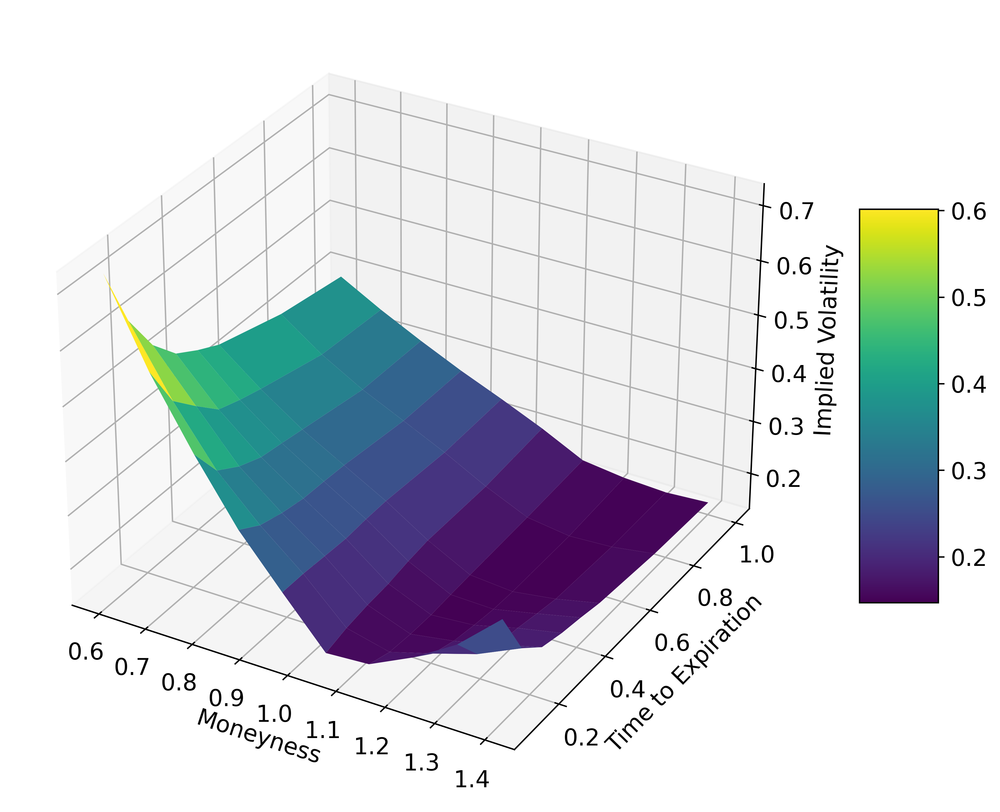

In [13]:
# Select first valid date - 2022-03-21
selected_date = unique_dates[53]
selected_vol_surface = vol_surfaces[selected_date]
selected_r_surface = r_surfaces[selected_date]
# Plot implied volatility surface
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
M, T = np.meshgrid(moneyness_grid, dte1_grid)
surf = ax.plot_surface(M, T, selected_vol_surface, cmap='viridis', edgecolor='none')  # Note the transpose
ax.set_xlabel('Moneyness')
ax.set_ylabel('Time to Expiration')
ax.set_zlabel('Implied Volatility')
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('selected_ivs.eps', format='eps')
plt.show()

# Static arbitrage constraints

## Calculation of static arbitrage constraints

In [14]:
def compute_arbitrage_penalties(moneyness, times_to_expiry):
    """
    Compute arbitrage penalties for maturity, strike, and butterfly constraints.

    Parameters:
    moneyness: Array of moneyness values sorted in ascending order.
    times_to_expiry: Array of times to expiry sorted in ascending order.

    Returns:
    P_maturity: Arbitrage penalty for the maturity constraint.
    P_strike: Arbitrage penalty for the strike constraint.
    P_butterfly: Arbitrage penalty for the butterfly constraint.
    """
    P_maturity = np.zeros((len(times_to_expiry), len(times_to_expiry)))
    P_strike = np.zeros((len(moneyness), len(moneyness)))
    P_butterfly = np.zeros((len(moneyness), len(moneyness)))

    # Compute penalty for maturity constraint (P_T)
    for j in range(len(times_to_expiry) - 1):
        P_maturity[j, j] = times_to_expiry[j] / (times_to_expiry[j + 1] - times_to_expiry[j])
        P_maturity[j + 1, j] = -times_to_expiry[j] / (times_to_expiry[j + 1] - times_to_expiry[j])

    # Compute penalty for strike constraint (P_K)
    for i in range(len(moneyness) - 1):
        P_strike[i, i] = -1 / (moneyness[i + 1] - moneyness[i])
        P_strike[i, i + 1] = 1 / (moneyness[i + 1] - moneyness[i])

    # Compute penalty for butterfly constraint (PB_K)
    for i in range(1, len(moneyness) - 1):
        denominator = (moneyness[i] - moneyness[i - 1]) * (moneyness[i + 1] - moneyness[i])
        PB_k_minus = -(moneyness[i + 1] - moneyness[i]) / denominator
        PB_k = (moneyness[i + 1] - moneyness[i - 1]) / denominator
        PB_k_plus = -(moneyness[i] - moneyness[i - 1]) / denominator
        P_butterfly[i, i - 1] = PB_k_minus
        P_butterfly[i, i] = PB_k
        P_butterfly[i, i + 1] = PB_k_plus

    return P_maturity, P_strike, P_butterfly

def arbitrage_penalty(C, P_maturity, P_strike, P_butterfly):
    """
    Calculate arbitrage penalties based on call option prices and penalty matrices.

    Parameters:
    call_prices: Matrix of call option prices for a fixed grid (K, T).
    maturity_penalty: Penalty matrix for violating increasing maturity constraint.
    strike_penalty: Penalty matrix for violating decreasing strike constraint.
    butterfly_penalty: Penalty matrix for violating convex strike constraint.

    Returns:
    maturity_penalties: Penalty matrix for violating increasing maturity constraint.
    strike_penalties: Penalty matrix for violating decreasing strike constraint.
    butterfly_penalties: Penalty matrix for violating convex strike constraint.
    total_penalty: Scalar sum of all penalties.
    """
    P1 = np.maximum(0,np.matmul(C,P_maturity))
    P2 = np.maximum(0,np.matmul(P_strike,C))
    P3 = np.maximum(0,np.matmul(P_butterfly,C))
    
    return P1,P2,P3,np.sum(P1+P2+P3)

def BS_m_tau(m, tau, sigma, r):
    """
    Relative BS call price using moneyness and tau.
    """
    d1 = (-np.log(m)+tau*(r+0.5*sigma*sigma))/(sigma*np.sqrt(tau))
    d2 = d1-sigma*np.sqrt(tau)
    results = norm.cdf(d1)-m*norm.cdf(d2)*np.exp(-r*tau)
    
    return results

def call_mat(mu, tau, sigma, r):
    """
    Relative BS call prices matrix using moneyness and tau.
    """
    result = np.zeros((len(mu),len(tau)))
    for i in np.arange(0,len(mu),1):
        for j in np.arange(0,len(tau),1):
            result[i, j] = BS_m_tau(mu[i],tau[j],sigma[j,i],r[j,i])
    return result

In [15]:
P_maturity, P_strike, P_butterfly = compute_arbitrage_penalties(moneyness_grid, dte1_grid)
C = call_mat(moneyness_grid, dte1_grid, selected_vol_surface, selected_r_surface)
P1,P2,P3,P_sum = arbitrage_penalty(C, P_maturity, P_strike, P_butterfly)

## Check the arbitrage constraints on selected date

In [40]:
def is_increasing(matrix):
    # Iterate over each row
    for row in matrix:
        # Check if the elements in the row are in increasing order
        if not all(row[i] <= row[i+1] for i in range(len(row)-1)):
            return False
    return True

# Test if the matrix C is increasing in time to maturity
increasing = is_increasing(C)
print("Increasing in time to maturity:", increasing)

Increasing in time to maturity: True


In [41]:
def is_decreasing(matrix):
    # Iterate over each column
    for col in matrix.T:
        # Check if the elements in the column are in decreasing order
        if not all(col[i] >= col[i+1] for i in range(len(col)-1)):
            return False
    return True

# Test if the matrix C is decreasing in moneyness
decreasing = is_decreasing(C)
print("Decreasing in moneyness:", decreasing)

Decreasing in moneyness: False


In [42]:
def is_convex(matrix):
    # Iterate over each column
    for col in matrix.T:
        # Calculate the second differences
        second_diff = np.diff(np.diff(col))
        # Check if all second differences are non-negative
        if not all(diff >= 0 for diff in second_diff):
            return False
    return True

# Test if the matrix C is convexing in moneyness
convex = is_convex(C)
print("Convexing in moneyness:", convex)

Convexing in moneyness: True


Note that decreasing in moneyness is not hold for all $m$ and $\tau$, so $P_2$ is not flat at 0.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


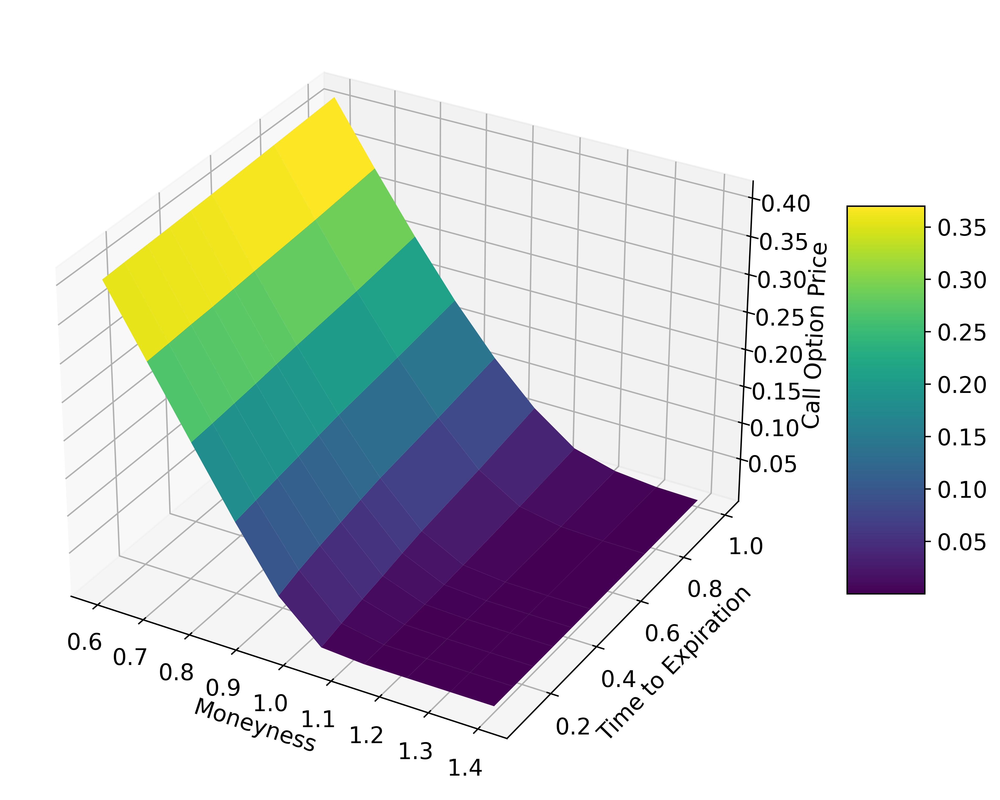

In [43]:
# Plot the call price
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M, T, np.transpose(C), cmap='viridis', edgecolor='none')
ax.set_xlabel('Moneyness')
ax.set_ylabel('Time to Expiration')
ax.set_zlabel('Call Option Price')
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('call_price.eps', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


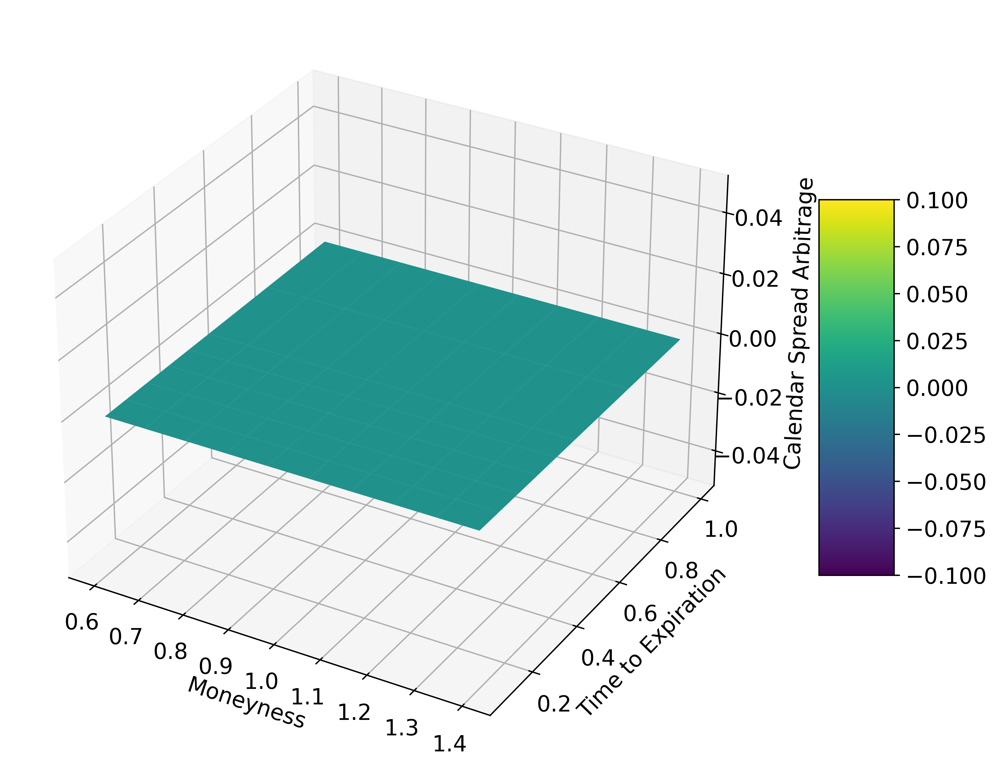

In [44]:
# Plot P1
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M, T, np.transpose(P1), cmap='viridis', edgecolor='none')
ax.set_xlabel('Moneyness')
ax.set_ylabel('Time to Expiration')
ax.set_zlabel('Calendar Spread Arbitrage', labelpad=8)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('const1.eps', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


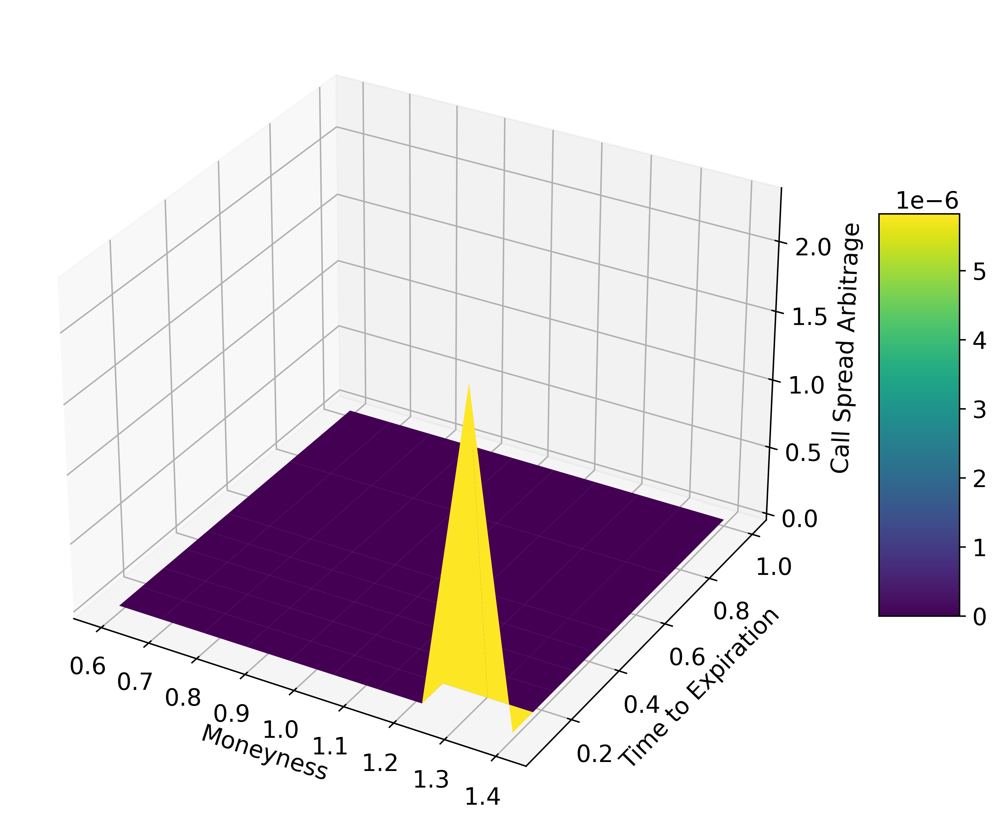

In [45]:
# Plot P2
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M, T, np.transpose(P2), cmap='viridis', edgecolor='none')
ax.set_xlabel('Moneyness')
ax.set_ylabel('Time to Expiration')
ax.set_zlabel('Call Spread Arbitrage')
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('const2.eps', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


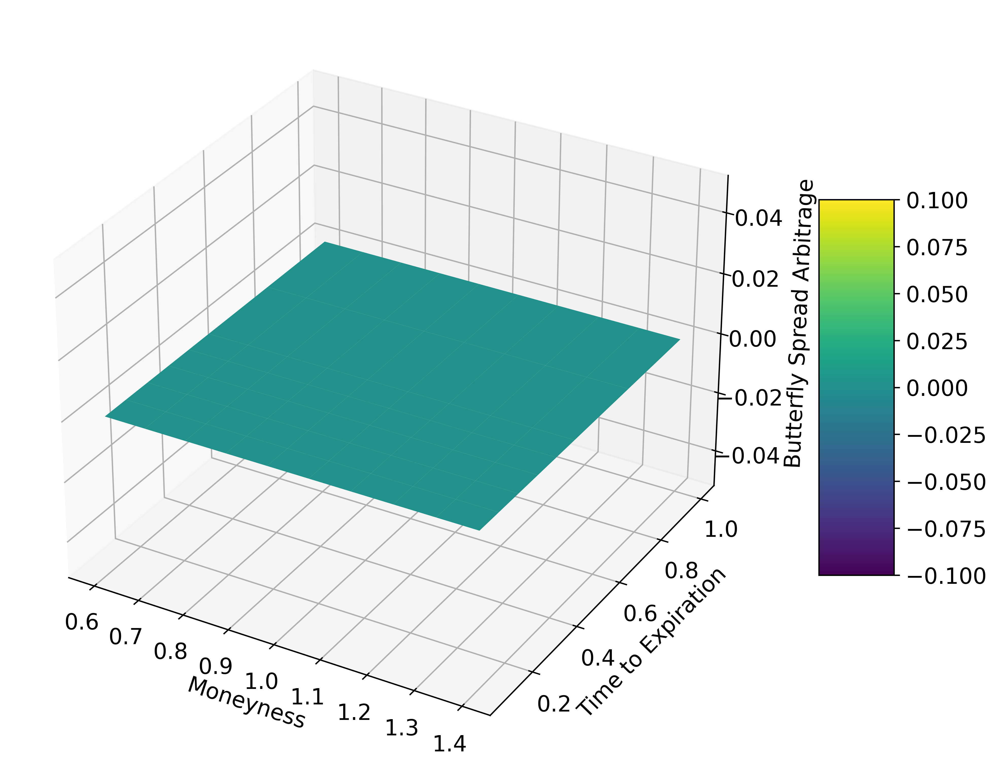

In [46]:
# Plot P3
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M, T, np.transpose(P3), cmap='viridis', edgecolor='none')
ax.set_xlabel('Moneyness')
ax.set_ylabel('Time to Expiration')
ax.set_zlabel('Butterfly Spread Arbitrage', labelpad=8)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('const3.eps', format='eps')
plt.show()

## Behaviour of arbitrage penalty under perturbations

### Addition of IID noise

In [49]:
# Parameters
num_samples = 10000
epsilon = 0.01

# Create IID noise
noise = np.random.normal(loc=0, scale=epsilon, size=(num_samples,) + selected_vol_surface.shape)

# Add noise to selected_vol_surface
sampled_vol_surfaces = selected_vol_surface + noise

In [52]:
def compute_arbitrage_values(moneyness_grid, dte1_grid, sampled_vol_surfaces, selected_r_surface, num_samples=10000):
    """
    Compute arbitrage penalties for a given number of samples.

    Parameters:
    moneyness_grid: Array of moneyness values.
    dte1_grid: Array of days to expiry values.
    sampled_vol_surfaces: Array of sampled volatility surfaces.
    selected_r_surface: Selected risk-free rate surface.
    num_samples: Number of samples to compute arbitrage penalties (default is 10000).

    Returns:
    P1_values: List of penalty matrices for violating increasing maturity constraint.
    P2_values: List of penalty matrices for violating decreasing strike constraint.
    P3_values: List of penalty matrices for violating convex strike constraint.
    P_sum_values: List of total penalty values.
    """
    # Compute penalty matrices for maturity, strike, and butterfly constraints
    P_maturity, P_strike, P_butterfly = compute_arbitrage_penalties(moneyness_grid, dte1_grid)
    
    # Initialize lists to store penalty values
    P1_values = []
    P2_values = []
    P3_values = []
    P_sum_values = []

    # Iterate over the specified number of samples
    for i in tqdm(range(num_samples)):
        # Compute call option prices for the current sample
        C = call_mat(moneyness_grid, dte1_grid, sampled_vol_surfaces[i], selected_r_surface)
        
        # Compute arbitrage penalties for the current sample
        P1, P2, P3, P_sum = arbitrage_penalty(C, P_maturity, P_strike, P_butterfly)
        
        # Append penalty values to respective lists
        P1_values.append(P1)
        P2_values.append(P2)
        P3_values.append(P3)
        P_sum_values.append(P_sum)
    
    # Return lists of penalty values
    return P1_values, P2_values, P3_values, P_sum_values

In [53]:
P1_values, P2_values, P3_values, P_sum_values = compute_arbitrage_values(moneyness_grid, dte1_grid, sampled_vol_surfaces, selected_r_surface)

100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [02:15<00:00, 73.72it/s]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


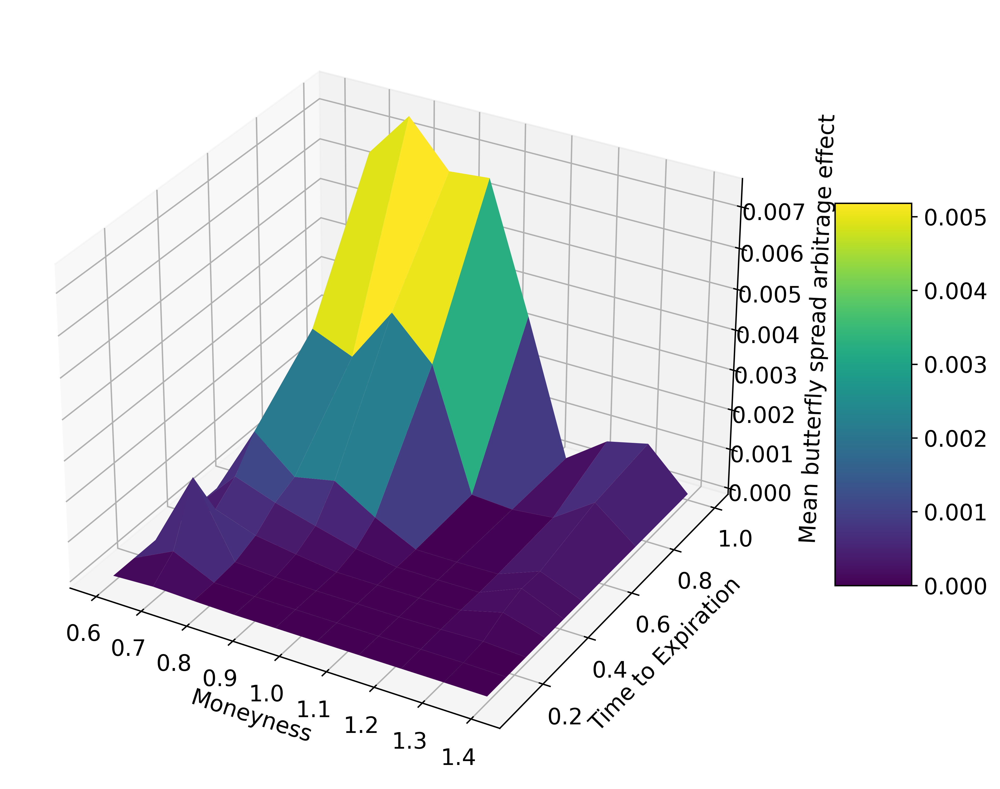

In [54]:
# Plot P3 mean
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M, T, np.transpose(np.mean(P3_values, axis = 0)), cmap='viridis', edgecolor='none')  # Note the transpose
ax.set_xlabel('Moneyness')
ax.set_ylabel('Time to Expiration')
ax.set_zlabel('Mean butterfly spread arbitrage effect', labelpad=9)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('P3_iid.eps', format='eps')
plt.show()

### Parallel shifts

In [55]:
selected_date = unique_dates[53]  
selected_vol_surface = vol_surfaces[selected_date]
selected_r_surface = r_surfaces[selected_date]

# Generate a range of shifts for the volatility surface
shift_range = np.linspace(-0.8, 0.8, 19)

# Initialize lists to store penalty values
P1_values = []
P2_values = []
P3_values = []
P_sum_values = []

for shift in tqdm(shift_range):
    # Shift the volatility surface by multiplying it with (1 + shift)
    shifted_surface = (1 + shift) * selected_vol_surface
    
    # Compute call option prices for the shifted surface
    C = call_mat(moneyness_grid, dte1_grid, shifted_surface, selected_r_surface)
    
    # Compute arbitrage penalties for the call option prices
    P1, P2, P3, P_sum = arbitrage_penalty(C, P_maturity, P_strike, P_butterfly)
    
    # Append penalty values to respective lists
    P1_values.append(P1)
    P2_values.append(P2)
    P3_values.append(P3)
    P_sum_values.append(P_sum)

100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 70.98it/s]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


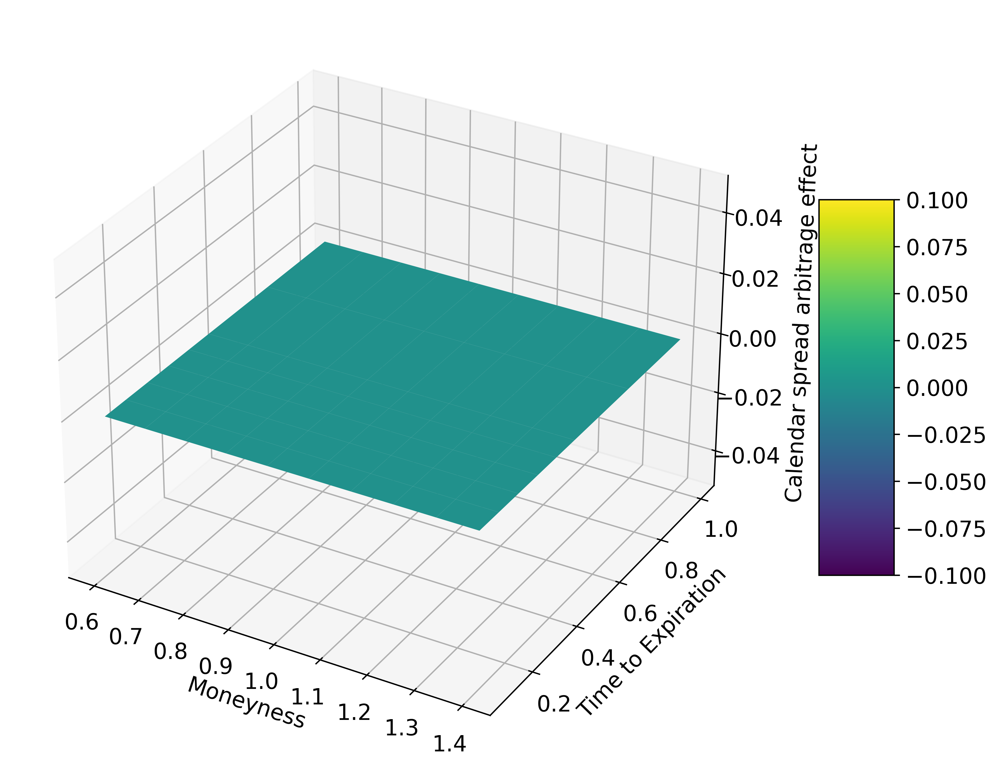

In [56]:
# Plot P1 for shift 0.8
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M, T, np.transpose(P1_values[-1]), cmap='viridis', edgecolor='none')
ax.set_xlabel('Moneyness')
ax.set_ylabel('Time to Expiration')
ax.set_zlabel('Calendar spread arbitrage effect', labelpad=9)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('P1_parallel.eps', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


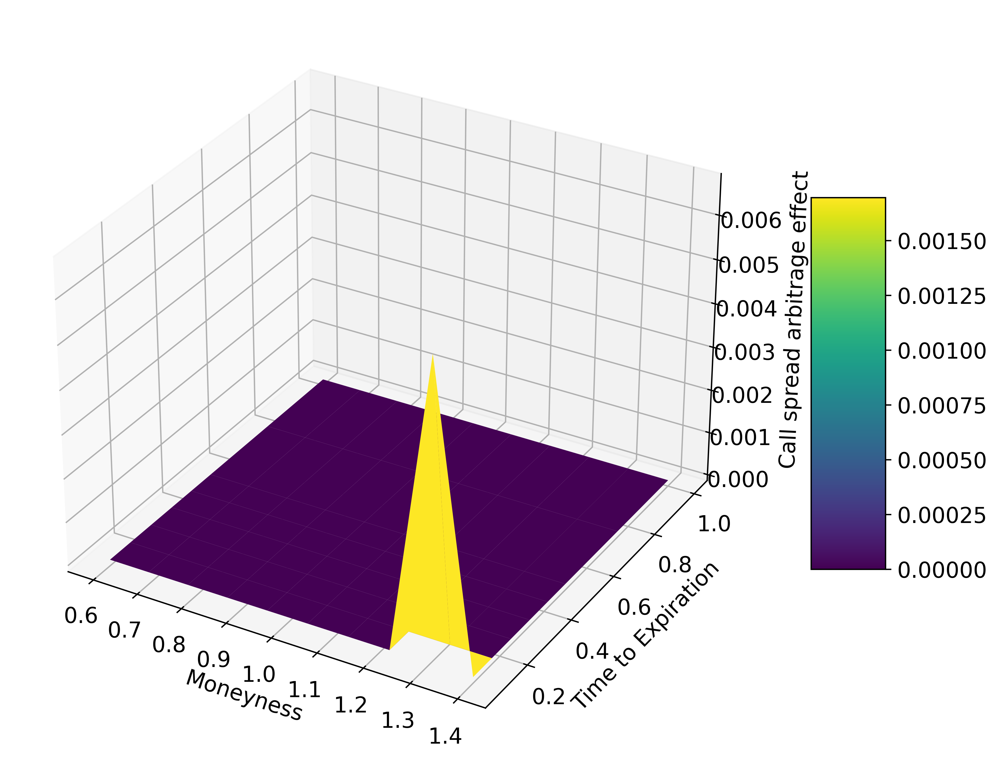

In [57]:
# Plot P2 for shift 0.8
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M, T, np.transpose(P2_values[-1]), cmap='viridis', edgecolor='none')
ax.set_xlabel('Moneyness')
ax.set_ylabel('Time to Expiration')
ax.set_zlabel('Call spread arbitrage effect', labelpad=9)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('P2_parallel.eps', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


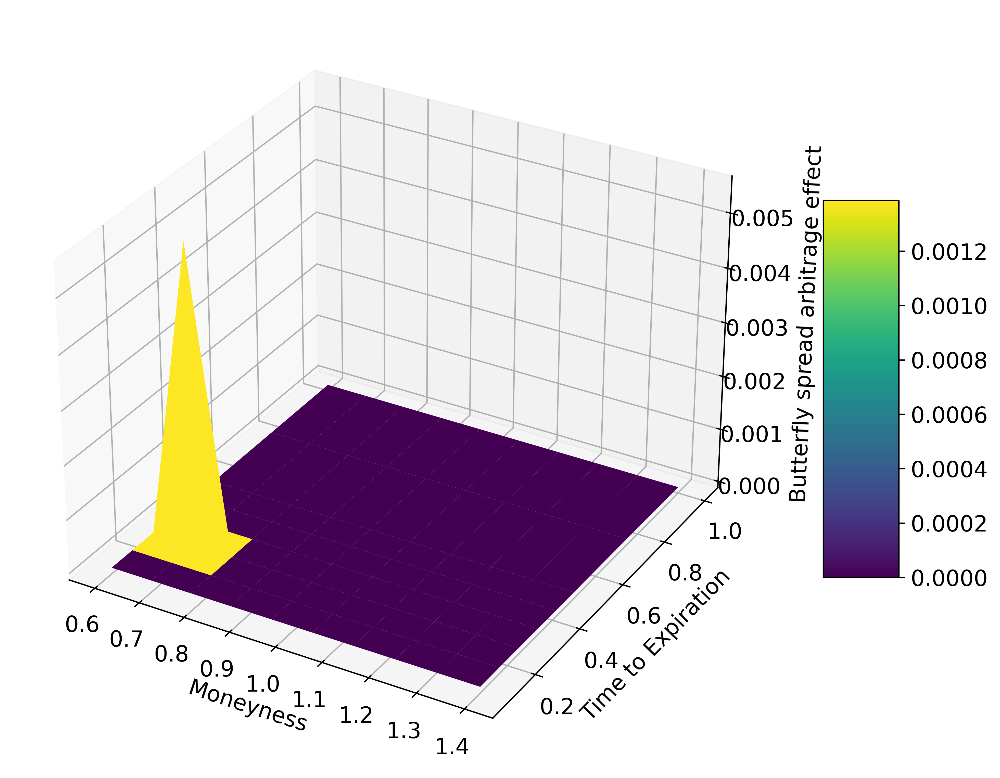

In [58]:
# Plot P3 for shift 0.8
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M, T, np.transpose(P3_values[-1]), cmap='viridis', edgecolor='none')
ax.set_xlabel('Moneyness')
ax.set_ylabel('Time to Expiration')
ax.set_zlabel('Butterfly spread arbitrage effect', labelpad=9)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('P3_parallel.eps', format='eps')
plt.show()

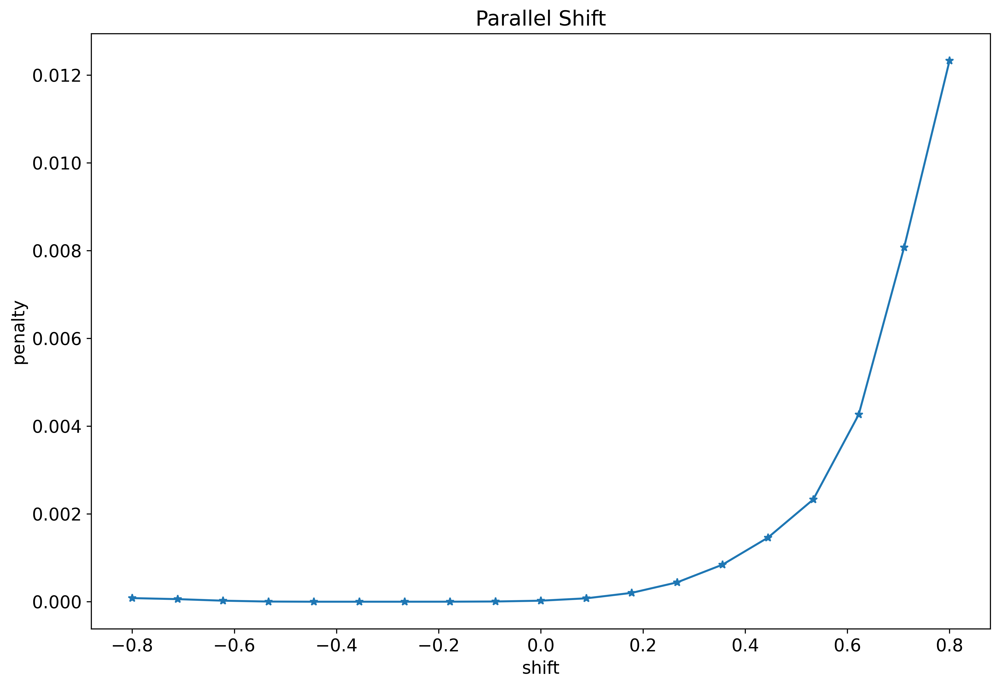

In [59]:
# Plot change of penalty under shift
plt.figure(figsize=(12, 8))
plt.plot(shift_range, P_sum_values, marker = '*')
plt.xlabel('shift')
plt.ylabel('penalty')
plt.title('Parallel Shift')
plt.savefig('parallel.eps', format='eps')
plt.show()

# Calculate mean, std and median of SPX data

In [23]:
unique_dates = df['date'].unique()
moneyness_grid = np.linspace(0.6, 1.4, 10)
dte_grid = np.array([30, 60, 91, 122, 152, 182, 273, 365])
dte1_grid = dte_grid/365

# Create a dictionary to hold the vol surface for each date
vol_surfaces = {}
r_surfaces = {}

for current_date in tqdm(unique_dates):
    # Filter the DataFrame for the current date
    df_date = df[df['date'] == current_date]
    # Linear interpolation
    points = np.array(list(zip(df_date['moneyness'], df_date['dte1'])))
    values = df_date['mid_vols']
    rs = df_date['r']
    
    # Create meshgrid for plotting
    M, T = np.meshgrid(moneyness_grid, dte1_grid)
    grid_points = np.array(list(zip(M.flatten(), T.flatten())))
    
    implied_vol_surface = griddata(points, values, grid_points, method='linear')
    implied_r_surface = griddata(points, rs, grid_points, method='linear')
    implied_vol_surface = implied_vol_surface.reshape(M.shape)
    implied_r_surface = implied_r_surface.reshape(M.shape)
    implied_vol_surface = np.nan_to_num(implied_vol_surface, nan=1e-8)
    implied_r_surface = np.nan_to_num(implied_r_surface, nan=1e-8)

    vol_surfaces[current_date] = implied_vol_surface
    r_surfaces[current_date] = implied_r_surface

100%|████████████████████████████████████████████████████████████████████████████████| 251/251 [00:25<00:00,  9.74it/s]


In [29]:
P_maturity, P_strike, P_butterfly = compute_arbitrage_penalties(moneyness_grid, dte1_grid)

P_sum_values = []

# Iterate over the specified number of samples
for key in tqdm(unique_dates[-23:]):
    # Compute call option prices for the current sample
    C = call_mat(moneyness_grid, dte1_grid, vol_surfaces[key], r_surfaces[key])

    # Compute arbitrage penalties for the current sample
    P1, P2, P3, P_sum = arbitrage_penalty(C, P_maturity, P_strike, P_butterfly)

    # Append penalty values to respective lists
    P_sum_values.append(P_sum)

100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 94.25it/s]


In [30]:
mean_value = np.mean(P_sum_values)
median_value = np.median(P_sum_values)
std_value = np.std(P_sum_values)

print("Mean of arbitrage penalty of SPX data:", mean_value)
print("Median of arbitrage penalty of SPX data:", median_value)
print("Standard Deviation of arbitrage penalty of SPX data:", std_value)

Mean of arbitrage penalty of SPX data: 0.46968379279905553
Median of arbitrage penalty of SPX data: 0.7002011110931022
Standard Deviation of arbitrage penalty of SPX data: 0.3424411522850559
